<a href="https://colab.research.google.com/github/SashaSBonacina/PET-Alzheimer-Prediction-Thesis/blob/main/Code_23_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up

## Importing libraries

In [1]:
from google.colab import drive
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import cv2, re, itertools,pathlib
from skimage import transform
import scipy.ndimage as ndi
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv3D, MaxPooling3D, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from sklearn.model_selection import KFold
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics


## Mounting google drive to access the data

In [2]:
drive.mount('/content/drive') #mounting drive

Mounted at /content/drive


## Loading in CSV with Image ID, Age, Sex

In [3]:
cols = ['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Description', 'Type', 'Acq Date'] # we dont need all the columns
df = pd.read_csv('/content/drive/MyDrive/CN FOR BAE DATA/Tx_Origin_SpatNORM_CN.csv', usecols = cols)
df.columns = ['ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Descrip', 'Type', 'Acq Date'] # renaming cols


In [4]:
df.head()

,ID,Subject,Group,Sex,Age,Visit,Descrip,Type,Acq Date
0,I387827,024_S_4084,CN,F,71,v21,[F-18]AV-45 Dy2 4i/16s AV45,Original,8/27/2013
1,I388229,024_S_4158,CN,M,86,v21,[F-18]AV-45 Dy2 4i/16s AV45,Original,8/30/2013
2,I509380,024_S_4158,CN,M,88,v41,[F-18]AV-45 Dy1 4i/16s AV45,Original,9/03/2015
3,I388228,024_S_4158,CN,M,86,v21,[F-18]AV-45 Dy1 4i/1 Early AV45,Original,8/30/2013
4,I387826,024_S_4084,CN,F,71,v21,[F-18]AV-45 Dy1 4i/1 Early AV45,Original,8/27/2013


Collecting file paths with the images

In [5]:
directory = '/content/drive/MyDrive/CN FOR BAE DATA/Tx_Origin_SpatNORM_CN_imageID' # enter the dir were the images are stored
image_ids = []
for filename in os.listdir(directory):
  image_ids.append(filename)
print(len(image_ids))

102


In [6]:
df = df[df['ID'].isin(image_ids)] #filterring the df so it only contains the data we need
df = df.reset_index()

In [7]:
df.shape

(102, 10)

Adding the image paths to the df for the corresponding image ID

In [8]:
# new colunm for the paths
df['Loc'] = ''
# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    image_id_folder = filename

    for image in os.listdir(f):
      f = os.path.join(f, image)
      if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
          df.loc[df['ID']==image_id_folder, 'Loc' ] = f # appending the path

In [9]:
df['Sex'] = df['Sex'].apply(lambda x: 1 if x == 'M' else -1)

# Data Information (vis)

## Bar graphs

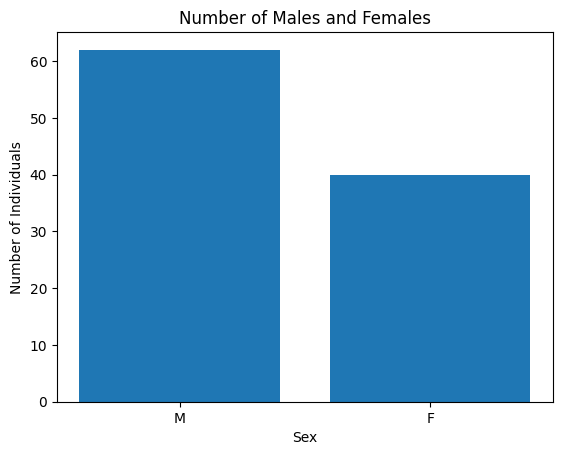

In [ ]:
sex_counts = df["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

Text(0.5, 1.0, 'Age Distribution for CN data')

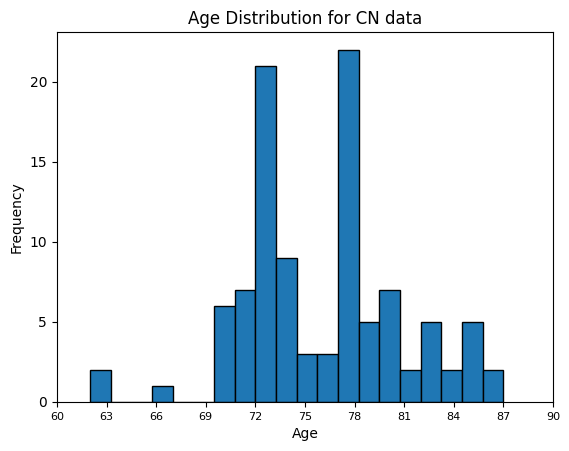

In [15]:
plt.hist(df["Age"], bins=20, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(60, 90, num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution for CN data")

In [ ]:
len(df['Subject'].unique())

102

Each subject has only 1 image in the df

No reshaping needed as all are the same shape! This is because the same processing steps were taken by ADNI for each image.

Furthermore each image is 3d not 4d, so t has been average through the image in processing

## Looking at one image

<class 'nibabel.nifti1.Nifti1Image'>
<class 'numpy.memmap'>


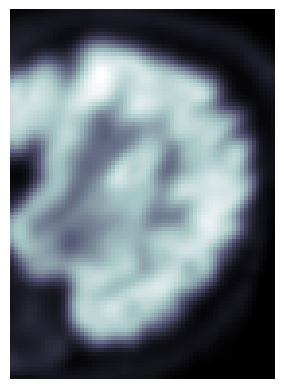

In [19]:
x = list(df['Loc'])[11] # getting a random image path
brain_vol = nib.load(x)
# What is the type of this object?
print(type(brain_vol))
brain_vol_data = brain_vol.get_fdata()
print(type(brain_vol_data))
plt.imshow(brain_vol_data[60], cmap='bone')
plt.axis('off')
plt.show()

# Building some models!

## 3D model

### preparing the data

In [10]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv3D, MaxPooling3D, Flatten, Dense, Dropout
import keras
from keras.models import load_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



Extracting data in the correct format for the model

In [11]:
# Extract image data and corresponding ages from the DataFrame
image_paths = df['Loc'].values
ages = df['Age'].values
sexes = df['Sex'].values

# Initialize empty lists to store image arrays and labels
image_data = []
labels = []

# Loop through each image path, load the image, and append to the lists
for path, age in zip(image_paths, ages):
    image = nib.load(path).get_fdata()
    image_data.append(image)
    labels.append(age)

# Convert lists to numpy arrays
image_data = np.array(image_data)
labels = np.array(labels)

# Reshape the image data to match the CNN input shape (128, 128, 82, 6) -> (samples, 128, 128, 82, 6)
image_data = image_data.reshape(-1, 79, 95, 68, 1)



In [12]:
count = 0
locations = []
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

9677


In [13]:
from collections import Counter
Counter([ele[0] for ele in locations])

Counter({10: 5392, 60: 4285})

images 10 and 60 have some nans, as this is only 1% of the image we can replace the pixels with averages

In [14]:
x = list(df['Loc'])[10] # getting a random image path
brain_vol = nib.load(x)
# What is the type of this object?
type(brain_vol)

nibabel.nifti1.Nifti1Image

In [15]:
brain_vol_data = brain_vol.get_fdata()
type(brain_vol_data)

numpy.memmap

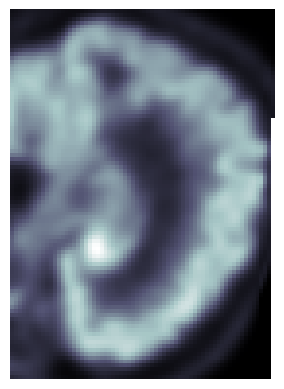

In [16]:
plt.imshow(brain_vol_data[50], cmap='bone')
plt.axis('off')
plt.show()

we can see the nans on the right hand side of the image

In [17]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  image_data[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)


In [18]:
"""count = 0
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)"""

'count = 0\nshape = image_data.shape\nfor a in range(shape[0]):\n  for b in range(shape[1]):\n    for c in range(shape[2]):\n      for d in range(shape[3]):\n        if pd.isna(image_data[a][b][c][d]):\n          locations.append([a,b,c,d])\n          count+=1\nprint(count)'

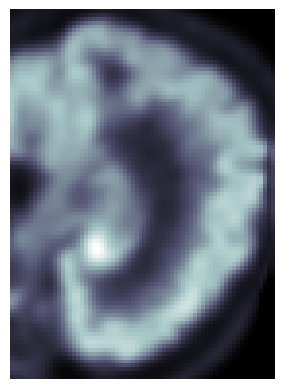

In [19]:
plt.imshow(image_data[10][50], cmap='bone')
plt.axis('off')
plt.show()

th e image data now have no Nans, i have filled in the nana by looking at pixels around the nan

In [20]:
from numpy.random import seed
seed(1)
# Set the random seed
tf.random.set_seed(42)

In [21]:
image_data.shape

(102, 79, 95, 68, 1)

In [22]:
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv3D, MaxPooling3D, concatenate

### Baseline
the baseline will be the average of the ages

In [ ]:
mean_age = np.mean(ages)

In [ ]:
predictions = np.ones(len(test_labels))*mean_age


# Calculate different evaluation metrics
mse = mean_squared_error(test_labels, predictions)
mae = mean_absolute_error(test_labels, predictions)
r2 = r2_score(test_labels, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 20.140921074312082
Mean Absolute Error: 3.710084033613445
R-squared: -0.03521517409925745


### V1
model without sex, without transfer learning, ...

In [ ]:
def compile_model():
  model = Sequential() # using sequential

  # Add 3D Convolutional layers with MaxPooling
  model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
  model.add(MaxPooling3D(pool_size=(2, 2, 2)))
  model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
  model.add(MaxPooling3D(pool_size=(2, 2, 2)))


  # Flatten the output and add Dense layers for age prediction
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam',metrics=[metrics.mean_absolute_error])
  return model

In [ ]:
def cross_validate(X, y, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        model = compile_model() # compile model
        histories.append(model.fit(X[train], y[train],
                                   validation_data = (X[test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate(X[test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict(X[test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_111, histories_111, r2_111 = cross_validate(image_data, ages, K = 5)

Epoch 1/200
6/6 [==============================] - 6s 432ms/step - loss: 3070.9160 - mean_absolute_error: 46.3786 - val_loss: 2167.8105 - val_mean_absolute_error: 46.2958
Epoch 2/200
6/6 [==============================] - 1s 244ms/step - loss: 1215.9377 - mean_absolute_error: 31.8668 - val_loss: 507.8205 - val_mean_absolute_error: 21.9146
Epoch 3/200
6/6 [==============================] - 1s 243ms/step - loss: 428.7243 - mean_absolute_error: 18.2904 - val_loss: 339.3802 - val_mean_absolute_error: 17.7119
Epoch 4/200
6/6 [==============================] - 1s 242ms/step - loss: 377.4108 - mean_absolute_error: 18.6187 - val_loss: 26.4095 - val_mean_absolute_error: 4.5914
Epoch 5/200
6/6 [==============================] - 1s 247ms/step - loss: 173.5617 - mean_absolute_error: 11.4009 - val_loss: 26.2886 - val_mean_absolute_error: 4.5267
Epoch 6/200
6/6 [==============================] - 1s 243ms/step - loss: 94.5712 - mean_absolute_error: 8.0312 - val_loss: 72.3813 - val_mean_absolute_error

1/1 [==============================] - 0s 107ms/step
Epoch 1/200
6/6 [==============================] - 3s 306ms/step - loss: 1306.4696 - mean_absolute_error: 24.0980 - val_loss: 154.9322 - val_mean_absolute_error: 11.5480
Epoch 2/200
6/6 [==============================] - 2s 263ms/step - loss: 165.5886 - mean_absolute_error: 11.0473 - val_loss: 76.0516 - val_mean_absolute_error: 7.7382
Epoch 3/200
6/6 [==============================] - 2s 260ms/step - loss: 76.7667 - mean_absolute_error: 7.4181 - val_loss: 35.8663 - val_mean_absolute_error: 4.7837
Epoch 4/200
6/6 [==============================] - 2s 260ms/step - loss: 67.4920 - mean_absolute_error: 6.8145 - val_loss: 125.1193 - val_mean_absolute_error: 10.0371
Epoch 5/200
6/6 [==============================] - 2s 260ms/step - loss: 50.1855 - mean_absolute_error: 5.6139 - val_loss: 33.6515 - val_mean_absolute_error: 4.7036
Epoch 6/200
6/6 [==============================] - 2s 259ms/step - loss: 31.5762 - mean_absolute_error: 4.6221 - 

1/1 [==============================] - 0s 108ms/step
average test MSE:  29.510755920410155
average test MAE:  4.453466463088989
average test r2:  -2.512281929073577
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_8 (Conv3D)           (None, 77, 93, 66, 32)    896       
                                                                 
 max_pooling3d_8 (MaxPooling  (None, 38, 46, 33, 32)   0         
 3D)                                                             
                                                                 
 conv3d_9 (Conv3D)           (None, 36, 44, 31, 64)    55360     
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 18, 22, 15, 64)   0         
 3D)                                                             
                                                                 
 flatten_39 (Flatten)

Zoom in on the graph

We see that the model is unstable and over fits for high epochs

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
X_train, X_test, y_train, y_test, sex_train, sex_test= train_test_split(image_data, ages, sexes, test_size=0.2)
model.fit(X_train, y_train, epochs = 200, batch_size = 16)
predictions = model.predict(X_test)




Epoch 1/200
6/6 [==============================] - 3s 223ms/step - loss: 4804.8862 - mean_absolute_error: 51.9270
Epoch 2/200
6/6 [==============================] - 1s 213ms/step - loss: 3190.2498 - mean_absolute_error: 55.7494
Epoch 3/200
6/6 [==============================] - 1s 213ms/step - loss: 524.8180 - mean_absolute_error: 19.6900
Epoch 4/200
6/6 [==============================] - 1s 212ms/step - loss: 223.7456 - mean_absolute_error: 12.9612
Epoch 5/200
6/6 [==============================] - 1s 212ms/step - loss: 316.8080 - mean_absolute_error: 16.2415
Epoch 6/200
6/6 [==============================] - 1s 212ms/step - loss: 112.7458 - mean_absolute_error: 9.2924
Epoch 7/200
6/6 [==============================] - 1s 213ms/step - loss: 35.9838 - mean_absolute_error: 4.8623
Epoch 8/200
6/6 [==============================] - 1s 211ms/step - loss: 47.0837 - mean_absolute_error: 5.4628
Epoch 9/200
6/6 [==============================] - 1s 212ms/step - loss: 42.8200 - mean_absolute_er

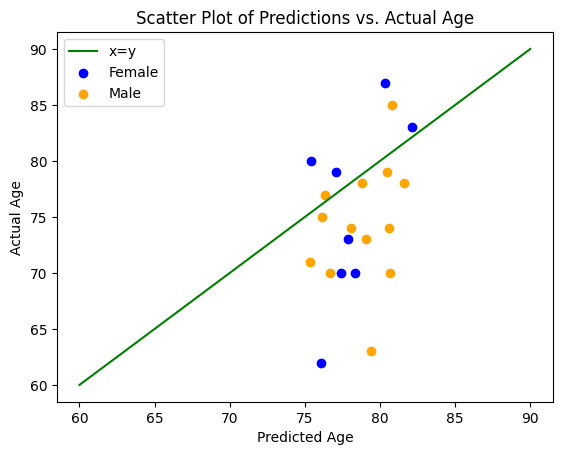

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(sex_test == g)
    plt.scatter(predictions[i], y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
del model
import gc
gc.collect()
tf.keras.backend.clear_session()

We see more males (1) above the line and females below, perhaps adding sex as a feature can improve the model? This will be done later

### V2
Adding early stopping to prevent overfitting

In [ ]:
model = Sequential() # using sequential

# Add 3D Convolutional layers with MaxPooling
model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu'))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Flatten the output and add Dense layers for age prediction
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

Lets train the model with early stopping

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', patience=100),
             ModelCheckpoint(filepath='basic_model.h5', monitor='val_loss', save_best_only=True)]

Epoch 1/200
4/4 [==============================] - 6s 877ms/step - loss: 1815.9822 - val_loss: 17.6195
Epoch 2/200
4/4 [==============================] - 1s 308ms/step - loss: 65.1401 - val_loss: 85.7217
Epoch 3/200
4/4 [==============================] - 1s 307ms/step - loss: 76.2787 - val_loss: 24.1464
Epoch 4/200
4/4 [==============================] - 1s 306ms/step - loss: 45.3227 - val_loss: 34.7534
Epoch 5/200
4/4 [==============================] - 1s 309ms/step - loss: 41.3167 - val_loss: 18.3467
Epoch 6/200
4/4 [==============================] - 1s 305ms/step - loss: 33.2154 - val_loss: 23.7530
Epoch 7/200
4/4 [==============================] - 1s 306ms/step - loss: 31.8532 - val_loss: 33.6271
Epoch 8/200
4/4 [==============================] - 1s 310ms/step - loss: 42.9918 - val_loss: 24.5418
Epoch 9/200
4/4 [==============================] - 1s 308ms/step - loss: 32.6458 - val_loss: 18.5745
Epoch 10/200
4/4 [==============================] - 1s 306ms/step - loss: 31.1114 - val_l

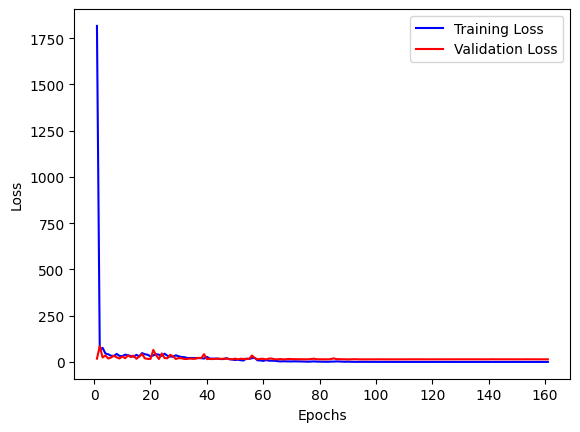

In [ ]:
# Run model.fit() and store the training history
history = model.fit(train_data, train_labels, epochs=200, batch_size=16, validation_split=0.2, callbacks = callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Zoom in on the graph

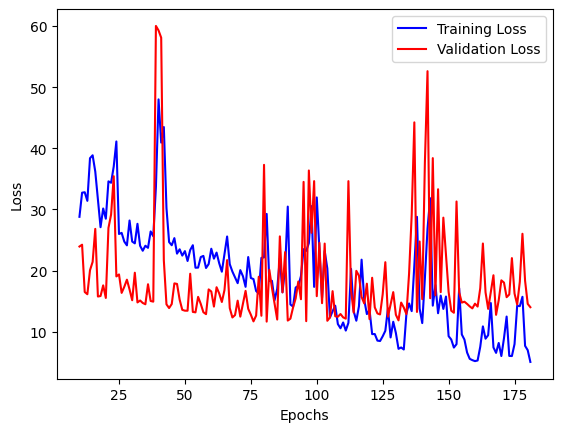

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

We see that the model begins to over fit for high epochs and this is where the early stopping stops the models from training

In [ ]:
from keras.models import load_model
saved_model = load_model('basic_model.h5')
train_acc = saved_model.evaluate(train_data, train_labels, verbose=0)
test_acc = saved_model.evaluate(test_data, test_labels, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

Train: 14.208, Test: 17.417


In [ ]:
# Evaluate the model on the test set
test_loss = saved_model.evaluate(test_data, test_labels)
print("Test Loss:", test_loss)


1/1 [==============================] - 0s 152ms/step - loss: 17.4171
Test Loss: 17.417123794555664


In [ ]:
predictions = saved_model.predict(test_data)
# Calculate different evaluation metrics
mse = mean_squared_error(test_labels, predictions)
mae = mean_absolute_error(test_labels, predictions)
r2 = r2_score(test_labels, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

1/1 [==============================] - 0s 93ms/step
Mean Squared Error: 17.417124618923047
Mean Absolute Error: 3.4120225452241444
R-squared: 0.10478415420220688


The model has improved a very small amount

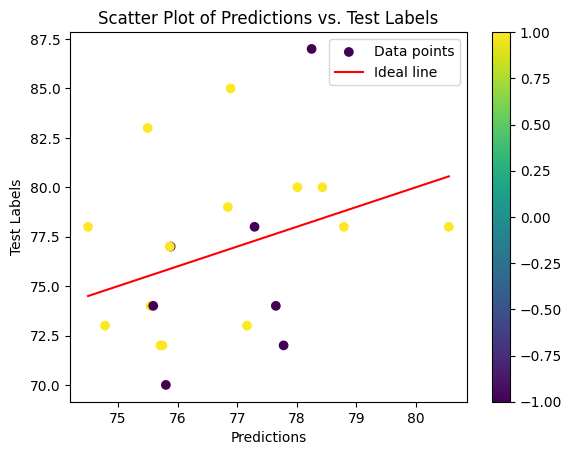

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
plt.scatter(predictions, test_labels, c=test_sex, cmap='viridis', label='Data points')
plt.plot([min(predictions), max(predictions)], [min(predictions), max(predictions)], c='red', label='Ideal line')

# Add labels and title
plt.xlabel('Predictions')
plt.ylabel('Test Labels')
plt.title('Scatter Plot of Predictions vs. Test Labels')

# Add a legend
plt.legend()

# Show the plot
plt.colorbar()  # Add a colorbar to show the mapping of colors to sex_train values
plt.show()



Somehow sex is now more scattered, we can still try adding it as a feature to see if it helps


###  V3
Adding sex as a feature with early stopping

In [23]:

def compile_model():
    # Define the input layer for the 3D Convolutional network
    input_img = Input(shape=(79, 95, 68, 1))

    # Apply 3D Convolutional layers with MaxPooling using the Functional API
    x = Conv3D(32, kernel_size=(3, 3, 3), activation='relu')(input_img)
    x = MaxPooling3D(pool_size=(2, 2, 2))(x)
    x = Conv3D(64, kernel_size=(3, 3, 3), activation='relu')(x)
    x = MaxPooling3D(pool_size=(2, 2, 2))(x)

    # Flatten the output and add Dense layers for age prediction
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    output_img = Dense(16, activation='relu')(x)

    # Define the input layer for the extra feature
    input_extra = Input(shape=(1,))

    # Concatenate the output of the Convolutional network with the extra feature
    merged = concatenate([output_img, input_extra])

    # Add Dense layers for further prediction
    merged = Dense(8, activation='relu')(merged)
    output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks

    # Define the model with both inputs and the final output
    model = Model(inputs=[input_img, input_extra], outputs=output)

    # Compile the model
    model.compile(loss='mean_squared_error', optimizer='adam',metrics=[metrics.mean_absolute_error])
    return model


In [25]:
from sklearn.model_selection import StratifiedKFold

def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    r2 = []

    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print(model.summary())
    return scores, histories, r2

In [26]:
scores_112, histories_112, r2_112 = cross_validate(image_data, ages, sexes, K = 5)

Epoch 1/200
6/6 [==============================] - 16s 449ms/step - loss: 4542.5005 - mean_absolute_error: 53.8300 - val_loss: 3112.8381 - val_mean_absolute_error: 55.4792
Epoch 2/200
6/6 [==============================] - 2s 248ms/step - loss: 2384.7485 - mean_absolute_error: 48.0877 - val_loss: 112.6366 - val_mean_absolute_error: 9.5458
Epoch 3/200
6/6 [==============================] - 1s 248ms/step - loss: 647.9234 - mean_absolute_error: 22.6975 - val_loss: 105.0388 - val_mean_absolute_error: 8.7975
Epoch 4/200
6/6 [==============================] - 1s 248ms/step - loss: 269.3250 - mean_absolute_error: 13.8823 - val_loss: 539.6708 - val_mean_absolute_error: 22.5309
Epoch 5/200
6/6 [==============================] - 1s 246ms/step - loss: 227.7699 - mean_absolute_error: 12.6748 - val_loss: 174.2254 - val_mean_absolute_error: 12.0158
Epoch 6/200
6/6 [==============================] - 2s 251ms/step - loss: 153.5700 - mean_absolute_error: 11.3018 - val_loss: 49.5648 - val_mean_absolute_

1/1 [==============================] - 0s 99ms/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d_8 (Conv3D)              (None, 77, 93, 66,   896         ['input_9[0][0]']                
                                32)                                                               
                                                                                                  
 max_pooling3d_8 (MaxPooling3D)  (None, 38, 46, 33,   0          ['conv3d_8[0][0]']               
                                32)     

In [60]:
np.mean([-1.7082423686411716, -1.3497437460218027, -2.4773533967008077, -2.722611121147865])

-2.064487658127912

In [36]:
np.mean([r2_112[:1] + r2_112[2:]])

-2.5622068467075256

In [29]:
scores_112

[[31.456600189208984, 4.581780433654785],
 [5812.4541015625, 76.0911865234375],
 [22.368276596069336, 3.43837308883667],
 [19.19979476928711, 3.5631489753723145],
 [30.954029083251953, 4.520724296569824]]

In [38]:
np.mean([4.581780433654785, 3.43837308883667,3.5631489753723145, 4.520724296569824])

4.026006698608398

In [39]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
X_train, X_test, y_train, y_test, sex_train, sex_test= train_test_split(image_data, ages, sexes, test_size=0.2)
model.fit([X_train, sex_train], y_train, epochs = 200, batch_size = 16)
predictions = model.predict([X_test, sex_test])

Epoch 1/200
6/6 [==============================] - 3s 232ms/step - loss: 1304.9496 - mean_absolute_error: 26.0095
Epoch 2/200
6/6 [==============================] - 1s 231ms/step - loss: 132.9226 - mean_absolute_error: 9.6069
Epoch 3/200
6/6 [==============================] - 1s 230ms/step - loss: 41.9616 - mean_absolute_error: 5.0215
Epoch 4/200
6/6 [==============================] - 1s 229ms/step - loss: 30.8599 - mean_absolute_error: 4.5325
Epoch 5/200
6/6 [==============================] - 1s 228ms/step - loss: 25.4729 - mean_absolute_error: 3.9464
Epoch 6/200
6/6 [==============================] - 1s 228ms/step - loss: 22.9068 - mean_absolute_error: 3.8876
Epoch 7/200
6/6 [==============================] - 1s 228ms/step - loss: 47.5561 - mean_absolute_error: 5.8436
Epoch 8/200
6/6 [==============================] - 1s 229ms/step - loss: 45.5302 - mean_absolute_error: 5.3573
Epoch 9/200
6/6 [==============================] - 1s 229ms/step - loss: 32.3337 - mean_absolute_error: 4.71

1/1 [==============================] - 0s 103ms/step


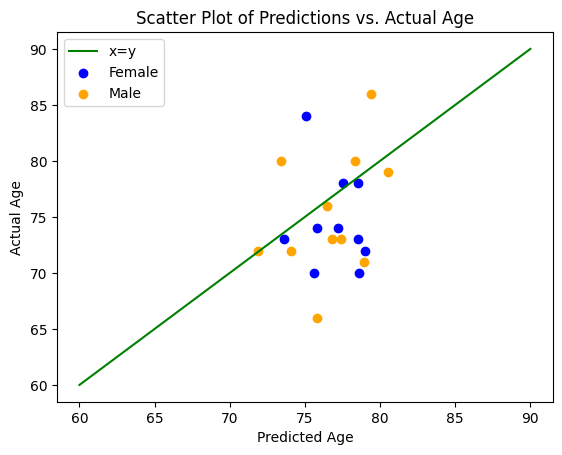

In [40]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(sex_test == g)
    plt.scatter(predictions[i], y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', patience=100),
             ModelCheckpoint(filepath='basic_sex_model.h5', monitor='val_loss', save_best_only=True)]

Epoch 1/100
4/4 [==============================] - 5s 1s/step - loss: 6828.8145 - val_loss: 4467.8594
Epoch 2/100
4/4 [==============================] - 3s 951ms/step - loss: 4400.7495 - val_loss: 3781.1741
Epoch 3/100
4/4 [==============================] - 4s 1s/step - loss: 2814.3694 - val_loss: 778.1365
Epoch 4/100
4/4 [==============================] - 1s 305ms/step - loss: 420.5643 - val_loss: 1214.3479
Epoch 5/100
4/4 [==============================] - 4s 1s/step - loss: 869.3428 - val_loss: 41.4731
Epoch 6/100
4/4 [==============================] - 1s 306ms/step - loss: 147.5361 - val_loss: 412.9963
Epoch 7/100
4/4 [==============================] - 1s 307ms/step - loss: 404.7803 - val_loss: 168.4288
Epoch 8/100
4/4 [==============================] - 1s 308ms/step - loss: 75.8432 - val_loss: 111.7802
Epoch 9/100
4/4 [==============================] - 1s 305ms/step - loss: 161.4918 - val_loss: 101.1150
Epoch 10/100
4/4 [==============================] - 1s 305ms/step - loss: 51.0

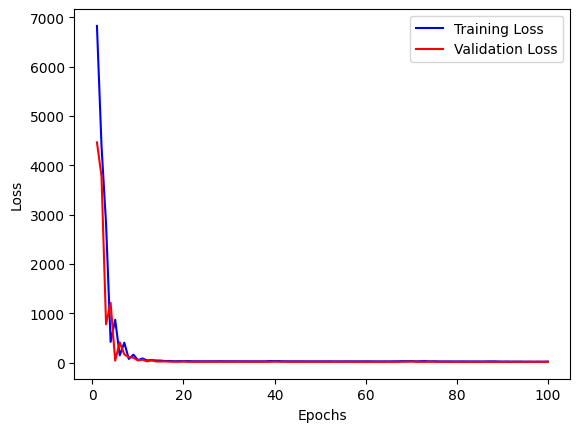

In [ ]:
# Run model.fit() and store the training history
history = model.fit([train_data, train_sex], train_labels, epochs=100, batch_size=16, validation_split=0.2, callbacks = callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

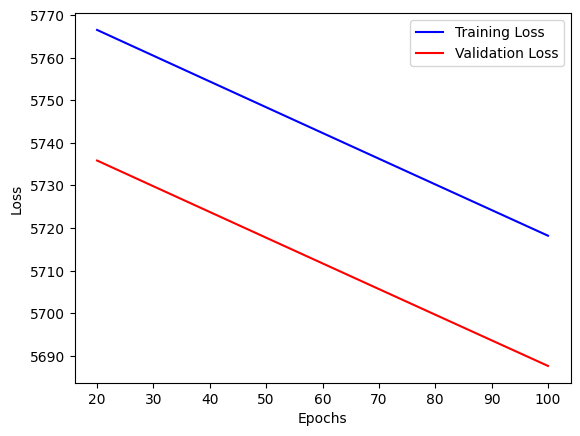

In [ ]:
epochs = range(20, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[19:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[19:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
saved_model = load_model('basic_sex_model.h5')
train_acc = saved_model.evaluate([train_data, train_sex], train_labels, verbose=0)
test_acc = saved_model.evaluate([test_data, test_sex], test_labels, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

Train: 20.991, Test: 18.977


In [ ]:
predictions = saved_model.predict([test_data, test_sex])
# Calculate different evaluation metrics
mse = mean_squared_error(test_labels, predictions)
mae = mean_absolute_error(test_labels, predictions)
r2 = r2_score(test_labels, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

1/1 [==============================] - 0s 98ms/step
Mean Squared Error: 18.97686843771953
Mean Absolute Error: 3.5381048293340776
R-squared: 0.024615503375953973


The model has improved slightly

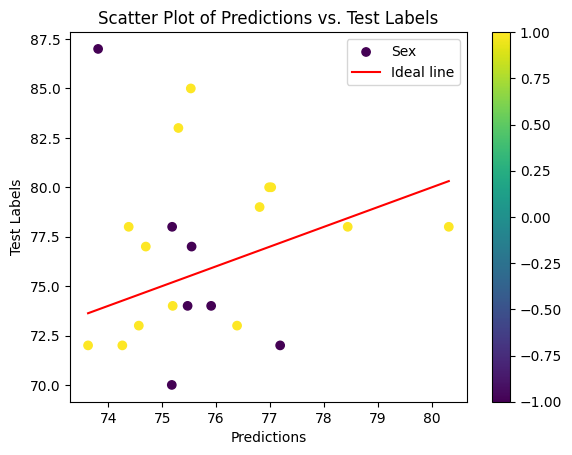

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
plt.scatter(predictions, test_labels, c=test_sex, cmap='viridis', label='Sex')
plt.plot([min(predictions), max(predictions)], [min(predictions), max(predictions)], c='red', label='Ideal line')

# Add labels and title
plt.xlabel('Predictions')
plt.ylabel('Test Labels')
plt.title('Scatter Plot of Predictions vs. Test Labels')

# Add a legend
plt.legend()

# Show the plot
plt.colorbar()  # Add a colorbar to show the mapping of colors to sex_train values
plt.show()



We see that after adding sex the poins are more equally spread however the model still does not perform too well, perhaps tuning the model will help

### V4
Tuning the model with bayesian optimisation, this is more effecient than grid and random search (typically)

In [41]:
pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.2/404.2 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.4/225.4 kB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.0 MB/s eta 0:00:00


In [42]:
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback
import gc

def create_model(kernel_size, num_layers, neurons1, neurons2, neurons3, learning_rate, dilation_rate, pool_size, dropout = 0.2, activation = 'relu', strides=(1,1,1), padding='same'):
  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(79, 95, 68, 1))
  x = Conv3D(neurons1, kernel_size=kernel_size, activation=activation)(input_img)
  x = MaxPooling3D(pool_size=pool_size)(x)
  x = Dropout(dropout)(x)
  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  for i in range(num_layers):
    try:
      x = Conv3D(neurons1, kernel_size=kernel_size, activation=activation)(x)
      x = MaxPooling3D(pool_size=pool_size)(x)
      x = Dropout(dropout)(x)
    except:
      traceback.print_exc()
      return(999)
  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(neurons2, activation=activation)(x)
  output_img = Dense(16, activation='relu')(x)
  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))
  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])
  # Add Dense layers for further prediction
  merged = Dense(neurons3, activation=activation)(merged)
  output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks
  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)
  optimizer = Adam(learning_rate=learning_rate)
  # Compile the model
  model.compile(loss='mean_squared_error', optimizer=optimizer)
  return model




def objective(trial):
    callbacks = [EarlyStopping(monitor='val_loss', patience=40),
             ModelCheckpoint(filepath='bayesian_model.h5', monitor='val_loss', save_best_only=True)]
    """return the mse"""
    num_layers = trial.suggest_int('num_layers', low = 1, high = 2, step = 1)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 16, step = 4)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 16, step = 4)
    neurons3 = trial.suggest_int('neurons3', low = 2, high = 16, step = 4)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 32, step = 8)
    learning_rate = trial.suggest_float('learning_rate', low = 0.00001, high = 0.01, step = 0.0005)

    kernel_size = trial.suggest_int('kernel_size', low = 3, high =5, step =1)
    dilation_rate = trial.suggest_int('dilation_rate', low = 1, high =3, step =1)
    pool_size = trial.suggest_int('pool_size', low = 1, high =2, step =1)

    # random forest classifier object
    model = create_model(kernel_size = (kernel_size,kernel_size,kernel_size), num_layers = num_layers, neurons1 = neurons1, neurons2 = neurons2, neurons3 = neurons3, learning_rate = learning_rate, dilation_rate=(dilation_rate,dilation_rate,dilation_rate), pool_size=(pool_size,pool_size,pool_size))
    print(model.summary())
    try:
      model.fit([train_data, train_sex], train_labels, epochs=200, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
    except:
      traceback.print_exc()
      del model
      gc.collect()
      tf.keras.backend.clear_session()
      return(50)
      #res = model.evaluate([test_data, test_sex], test_labels, verbose=0)
    try:
      saved_model = load_model('bayesian_model.h5')
      res = saved_model.evaluate([test_data, test_sex], test_labels, verbose=0)
      del model
      del saved_model
      gc.collect()
      tf.keras.backend.clear_session()
      #!rm bayesian_model.h5
      return(res)
    except:
      traceback.print_exc()
      print('callback error')
      del model
      gc.collect()
      tf.keras.backend.clear_session()
      return(50)


# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=50, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)

[I 2023-08-22 18:05:13,507] A new study created in memory with name: no-name-24178ac9-155e-4c6f-8144-dd98d4335084


Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d_12 (Conv3D)             (None, 76, 92, 65,   130         ['input_13[0][0]']               
                                2)                                                                
                                                                                                  
 max_pooling3d_12 (MaxPooling3D  (None, 38, 46, 32,   0          ['conv3d_12[0][0]']              
 )                              2)                                                          

/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 16] and step=4, but the range is not divisible by `step`. It will be replaced by [2, 14].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(
Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined


None


[I 2023-08-22 18:05:13,979] Trial 0 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 2, 'neurons2': 6, 'neurons3': 10, 'batch_size': 8, 'learning_rate': 0.007509999999999999, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   1260        ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 75, 91, 64,   0           ['conv3d[0][0]']                 
                                10)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:14,691] Trial 1 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 10, 'neurons2': 14, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 0.00101, 'kernel_size': 5, 'dilation_rate': 2, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   390         ['input_1[0][0]']                
                                6)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 38, 46, 32,   0           ['conv3d[0][0]']                 
                                6)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:15,355] Trial 2 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 6, 'neurons2': 6, 'neurons3': 6, 'batch_size': 24, 'learning_rate': 0.00801, 'kernel_size': 4, 'dilation_rate': 2, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   650         ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 38, 46, 32,   0           ['conv3d[0][0]']                 
                                10)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:15,978] Trial 3 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 10, 'neurons2': 10, 'neurons3': 6, 'batch_size': 32, 'learning_rate': 0.00701, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   910         ['input_1[0][0]']                
                                14)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 76, 92, 65,   0           ['conv3d[0][0]']                 
                                14)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:16,606] Trial 4 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 14, 'neurons2': 2, 'neurons3': 10, 'batch_size': 24, 'learning_rate': 0.00851, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 77, 93, 66,   168         ['input_1[0][0]']                
                                6)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 77, 93, 66,   0           ['conv3d[0][0]']                 
                                6)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:17,269] Trial 5 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 6, 'neurons2': 2, 'neurons3': 6, 'batch_size': 32, 'learning_rate': 0.005509999999999999, 'kernel_size': 3, 'dilation_rate': 2, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 77, 93, 66,   392         ['input_1[0][0]']                
                                14)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 77, 93, 66,   0           ['conv3d[0][0]']                 
                                14)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:17,912] Trial 6 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 14, 'neurons2': 2, 'neurons3': 6, 'batch_size': 24, 'learning_rate': 0.00201, 'kernel_size': 3, 'dilation_rate': 3, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 77, 93, 66,   392         ['input_1[0][0]']                
                                14)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 38, 46, 33,   0           ['conv3d[0][0]']                 
                                14)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:18,557] Trial 7 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 14, 'neurons2': 2, 'neurons3': 10, 'batch_size': 24, 'learning_rate': 0.00301, 'kernel_size': 3, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   1764        ['input_1[0][0]']                
                                14)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 75, 91, 64,   0           ['conv3d[0][0]']                 
                                14)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:19,207] Trial 8 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 14, 'neurons2': 6, 'neurons3': 2, 'batch_size': 8, 'learning_rate': 0.00501, 'kernel_size': 5, 'dilation_rate': 1, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   1764        ['input_1[0][0]']                
                                14)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 75, 91, 64,   0           ['conv3d[0][0]']                 
                                14)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:19,908] Trial 9 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 14, 'neurons2': 10, 'neurons3': 14, 'batch_size': 32, 'learning_rate': 0.00951, 'kernel_size': 5, 'dilation_rate': 1, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   130         ['input_1[0][0]']                
                                2)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 38, 46, 32,   0           ['conv3d[0][0]']                 
                                2)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:20,591] Trial 10 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 2, 'neurons2': 14, 'neurons3': 2, 'batch_size': 16, 'learning_rate': 0.00651, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   252         ['input_1[0][0]']                
                                2)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 37, 45, 32,   0           ['conv3d[0][0]']                 
                                2)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:21,318] Trial 11 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 2, 'neurons2': 14, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 1e-05, 'kernel_size': 5, 'dilation_rate': 2, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   1260        ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 37, 45, 32,   0           ['conv3d[0][0]']                 
                                10)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:22,070] Trial 12 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 10, 'neurons2': 10, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 0.00201, 'kernel_size': 5, 'dilation_rate': 2, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   390         ['input_1[0][0]']                
                                6)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 76, 92, 65,   0           ['conv3d[0][0]']                 
                                6)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:22,793] Trial 13 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 6, 'neurons2': 6, 'neurons3': 10, 'batch_size': 16, 'learning_rate': 1e-05, 'kernel_size': 4, 'dilation_rate': 1, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   1260        ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 75, 91, 64,   0           ['conv3d[0][0]']                 
                                10)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:23,504] Trial 14 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 10, 'neurons2': 14, 'neurons3': 14, 'batch_size': 16, 'learning_rate': 0.00351, 'kernel_size': 5, 'dilation_rate': 2, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   130         ['input_1[0][0]']                
                                2)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 38, 46, 32,   0           ['conv3d[0][0]']                 
                                2)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:24,182] Trial 15 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 2, 'neurons2': 10, 'neurons3': 10, 'batch_size': 8, 'learning_rate': 0.00401, 'kernel_size': 4, 'dilation_rate': 2, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   756         ['input_1[0][0]']                
                                6)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 37, 45, 32,   0           ['conv3d[0][0]']                 
                                6)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:24,831] Trial 16 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 6, 'neurons2': 6, 'neurons3': 14, 'batch_size': 16, 'learning_rate': 0.00651, 'kernel_size': 5, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 77, 93, 66,   280         ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 77, 93, 66,   0           ['conv3d[0][0]']                 
                                10)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:25,512] Trial 17 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 10, 'neurons2': 14, 'neurons3': 10, 'batch_size': 8, 'learning_rate': 0.00151, 'kernel_size': 3, 'dilation_rate': 1, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   130         ['input_1[0][0]']                
                                2)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 76, 92, 65,   0           ['conv3d[0][0]']                 
                                2)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:26,134] Trial 18 finished with value: 50.0 and parameters: {'num_layers': 1, 'neurons1': 2, 'neurons2': 10, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 0.00951, 'kernel_size': 4, 'dilation_rate': 2, 'pool_size': 1}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 75, 91, 64,   756         ['input_1[0][0]']                
                                6)                                                                
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 37, 45, 32,   0           ['conv3d[0][0]']                 
                                6)                                                            

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:26,778] Trial 19 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 6, 'neurons2': 6, 'neurons3': 10, 'batch_size': 16, 'learning_rate': 0.00101, 'kernel_size': 5, 'dilation_rate': 2, 'pool_size': 2}. Best is trial 0 with value: 50.0.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 79, 95, 68,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d (Conv3D)                (None, 76, 92, 65,   650         ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 max_pooling3d (MaxPooling3D)   (None, 38, 46, 32,   0           ['conv3d[0][0]']                 
                                10)                                                           

Traceback (most recent call last):
  File "<ipython-input-42-f315aadead1e>", line 64, in objective
    model.fit([train_data, train_sex], train_labels, epochs=100, batch_size= batch_size, validation_split=0.2, callbacks = callbacks)
NameError: name 'train_data' is not defined
[I 2023-08-22 18:05:27,432] Trial 20 finished with value: 50.0 and parameters: {'num_layers': 2, 'neurons1': 10, 'neurons2': 14, 'neurons3': 14, 'batch_size': 8, 'learning_rate': 0.007509999999999999, 'kernel_size': 4, 'dilation_rate': 3, 'pool_size': 2}. Best is trial 0 with value: 50.0.
[W 2023-08-22 18:05:27,689] Trial 21 failed with parameters: {'num_layers': 1, 'neurons1': 6, 'neurons2': 6, 'neurons3': 6, 'batch_size': 24, 'learning_rate': 0.00801, 'kernel_size': 4, 'dilation_rate': 2, 'pool_size': 2} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = f

KeyboardInterrupt: ignored

In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,neurons3,batch_size,learning_rate,kernel_size,dilation_rate,pool_size,val
13,2,18,10,6,8,0.00801,3,2,2,17.169088
18,2,2,6,2,40,0.01101,4,2,2,18.520231
21,2,10,6,6,24,0.03751,3,2,2,20.189688
31,2,18,2,10,32,0.04001,3,3,2,20.404203
5,2,18,2,6,32,0.03551,3,3,2,20.463205
15,2,18,6,6,16,0.01201,3,2,2,20.517544
44,2,18,6,6,32,0.02101,3,3,2,20.545509
11,2,14,22,6,64,0.03001,5,2,2,20.555658
41,2,18,2,6,32,0.03601,3,3,2,20.561245
35,2,14,6,14,24,0.02451,3,3,2,20.578238


In [ ]:
optuna.visualization.plot_contour(study)

In [ ]:
optuna.visualization.plot_param_importances(study)

Tuning the model seems to make no real improvement, therefore other approaches must be taken, transfer learning can help as we only have 100 images

### V5

In [ ]:
pip install classification-models-3D

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.5/69.5 kB 1.8 MB/s eta 0:00:00


In [ ]:
pip install keras_applications

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.4 MB/s eta 0:00:00


In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
image_data.shape

(102, 79, 95, 68, 1)

ASthis cnn takes in rgb input we must duplicate each image twice so that the input shapes match

In [ ]:
duplicated_data = np.repeat(image_data, 3, axis=-1)
print(duplicated_data.shape)

(102, 79, 95, 68, 3)


In [ ]:
train_data, test_data, train_sex, test_sex, train_labels, test_labels = train_test_split(duplicated_data, sexes, ages, test_size=0.2, random_state=42)

In [ ]:
model = Sequential()

for layer in pretrained_model.layers:
    model.add(layer)

# Freeze the weights of the pre-trained layers so they are not updated during training
for layer in model.layers:
    layer.trainable = False


# Flatten the output of the pre-trained model
x = Flatten()(model.output)

# Add Dense layers after concatenation
x = Dense(32, activation='relu')(x)

additional_input = Input(shape=(1,))

# Concatenate the flattened output with the new input
concatenated = concatenate([x, additional_input])
output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

# Create the final model
model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

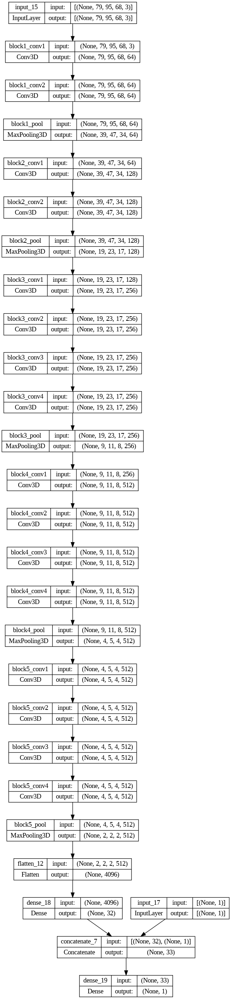

In [ ]:
keras.utils.plot_model(model, "multi_input_and_output_model.png", show_shapes=True) #vis of architecture

Epoch 1/100
8/8 [==============================] - 11s 1s/step - loss: 5176.6167 - val_loss: 4463.7065
Epoch 2/100
8/8 [==============================] - 10s 1s/step - loss: 3982.0000 - val_loss: 3359.2883
Epoch 3/100
8/8 [==============================] - 10s 1s/step - loss: 2929.2737 - val_loss: 2389.3027
Epoch 4/100
8/8 [==============================] - 9s 1s/step - loss: 2025.8621 - val_loss: 1581.1060
Epoch 5/100
8/8 [==============================] - 9s 1s/step - loss: 1288.4336 - val_loss: 955.9838
Epoch 6/100
8/8 [==============================] - 9s 1s/step - loss: 750.2000 - val_loss: 510.8414
Epoch 7/100
8/8 [==============================] - 9s 1s/step - loss: 380.1790 - val_loss: 236.3372
Epoch 8/100
8/8 [==============================] - 9s 1s/step - loss: 167.3687 - val_loss: 92.6683
Epoch 9/100
8/8 [==============================] - 9s 1s/step - loss: 67.6073 - val_loss: 33.7261
Epoch 10/100
8/8 [==============================] - 9s 1s/step - loss: 36.2149 - val_loss: 

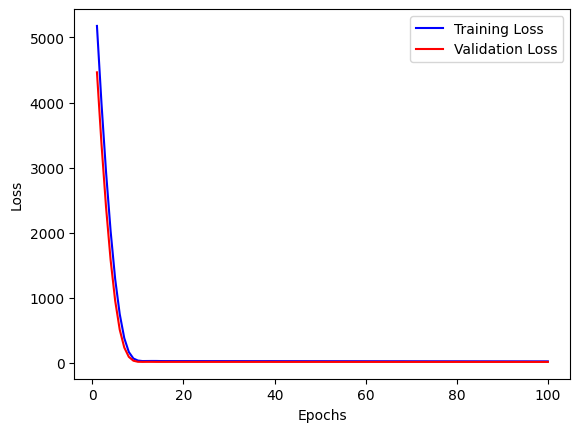

In [ ]:
import matplotlib.pyplot as plt
callbacks = [EarlyStopping(monitor='val_loss', patience=40),
             ModelCheckpoint(filepath='TL_model.h5', monitor='val_loss', save_best_only=True)]
# Run model.fit() and store the training history
history = model.fit([train_data, train_sex], train_labels, epochs=100, batch_size=8, validation_split=0.2, callbacks=callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
saved_model = load_model('TL_model.h5')
res = saved_model.evaluate([test_data, test_sex], test_labels, verbose=0)
print(res)

21.277732849121094


In [ ]:
model.evaluate([test_data, test_sex], test_labels, verbose=0)

21.681306838989258

## 2D

### Creating the 2D data

In [43]:
from skimage.feature import greycomatrix
from skimage import img_as_ubyte
twod_df = pd.DataFrame(columns = ['id','age','sex','entropy','data'])
slice_counter = 0
rotation_angle = 90
counter = 0
for image_array, age, sex in zip(image_data, ages, sexes):
  counter += 1
  nx, ny, nz, nw = image_array.shape
  total_volumes = image_array.shape[3]
  total_slices = image_array.shape[2]
  for current_volume in range(0, total_volumes):
      # iterate through slices
      for current_slice in range(0, total_slices):
          if (slice_counter % 1) == 0:
              if rotation_angle == 90:
                  data = np.rot90(image_array[:, :, current_slice, current_volume])
              elif rotation_angle == 180:
                  data = np.rot90(np.rot90(image_array[:, :, current_slice, current_volume]))
              elif rotation_angle == 270:
                  data = np.rot90(np.rot90(np.rot90(image_array[:, :, current_slice, current_volume])))
              #alternate slices and save as png
              if (slice_counter % 1) == 0:
                  print('Adding image...')
                  min_val = np.min(data)
                  max_val = np.max(data)
                  im = 2 * (data - min_val) / (max_val - min_val) - 1
                  im = img_as_ubyte(im)
                  glcm = np.squeeze(greycomatrix(im, distances=[1], angles=[0], symmetric=True, normed=True))
                  entropy = -np.sum(glcm*np.log2(glcm + (glcm==0)))
                  new_row = {'id':counter, 'age':age, 'sex':sex, 'entropy':entropy, 'data':data}
                  twod_df = twod_df.append(new_row, ignore_index=True)
                  #imsave(imge_folder +str(counter)+'_'+x_label2+'.jpg', data,format='jpg')
                  print('Saved.')



/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-43-ac445369d11a>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

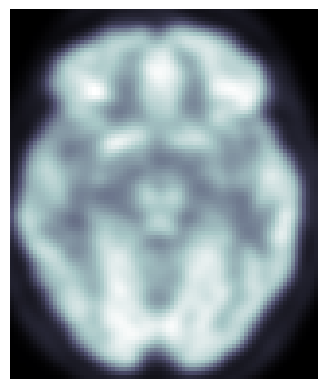

In [ ]:
plt.imshow(twod_df['data'][twod_df['entropy'].idxmax()], cmap='bone')
plt.axis('off')
plt.show()
# Syntax

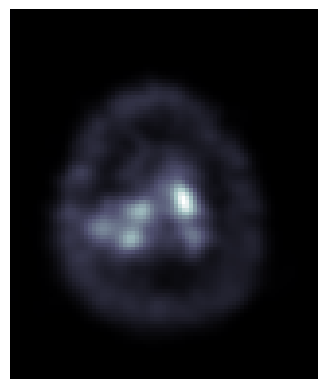

In [ ]:
plt.imshow(twod_df['data'][twod_df['entropy'].idxmin()], cmap='bone')
plt.axis('off')
plt.show()
# Syntax

In [44]:
high_entropy_df = pd.DataFrame(columns = ['id','age','sex','entropy','data'])
for id in twod_df.id.unique():
  filtered_df = twod_df[twod_df.id == id].sort_values(by=['entropy'], ascending=False).head(20)
  high_entropy_df = high_entropy_df.append(filtered_df)



<ipython-input-44-f322e777b01d>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-44-f322e777b01d>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-44-f322e777b01d>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-44-f322e777b01d>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-44-f322e777b01d>:4: FutureWarning: The frame.append method is deprecated and will be remo

In [100]:
group_id = np.array(high_entropy_df['id'])

In [46]:
X = np.array(high_entropy_df['data'])
y = np.array(high_entropy_df['age'])

In [47]:
X = np.array([X[i] for i in range(len(X))])
y = np.array([y[i] for i in range(len(y))])

In [48]:
high_entropy_df.shape

(2040, 5)

In [49]:
z =  np.array(high_entropy_df['sex'])
z = np.array([z[i] for i in range(len(z))])

In [60]:
print([i for i in range(1,103)])

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]


### V1

In [118]:
def compile_model():
  model = Sequential() # using sequential

  # Add 3D Convolutional layers with MaxPooling
  model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
  model.add(MaxPooling2D(pool_size=(2, 2)))


  # Flatten the output and add Dense layers for age prediction
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])

  return(model)

In [113]:
def cross_validate(X, y, K = 5):
    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit(X[train], y[train],
                                   validation_data = (X[test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate(X[test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict(X[test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2


In [114]:
scores, histories, r2 = cross_validate(X, y, K = 5)

Epoch 1/200
102/102 [==============================] - 2s 9ms/step - loss: 219.4288 - mean_absolute_error: 9.1442 - val_loss: 32.4966 - val_mean_absolute_error: 4.2024
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 29.9962 - mean_absolute_error: 4.3973 - val_loss: 35.6735 - val_mean_absolute_error: 4.3931
Epoch 3/200
102/102 [==============================] - 1s 6ms/step - loss: 25.9643 - mean_absolute_error: 4.0967 - val_loss: 28.8267 - val_mean_absolute_error: 3.9126
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 24.2915 - mean_absolute_error: 3.9597 - val_loss: 30.1132 - val_mean_absolute_error: 3.9207
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 22.1496 - mean_absolute_error: 3.7921 - val_loss: 32.1957 - val_mean_absolute_error: 4.0642
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 29.4622 - mean_absolute_error: 4.4411 - val_loss: 38.7725 - val_mean_absolute_error: 5.20

In [124]:
model = compile_model()

# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
for train, test in KFold(n_splits=5, shuffle=True).split(range(102)):
    train = [i for i,a in enumerate(group_id) if a in train+1]
    test = [i for i,a in enumerate(group_id) if a in test+1]
    break
history = model.fit(X[train], y[train], validation_data = (X[test],y[test]), epochs=200, batch_size=16).history
predictions = model.predict(X[test])

Epoch 1/200
102/102 [==============================] - 2s 8ms/step - loss: 320.1429 - mean_absolute_error: 10.4812 - val_loss: 48.2010 - val_mean_absolute_error: 5.5568
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 28.9686 - mean_absolute_error: 4.2058 - val_loss: 45.0629 - val_mean_absolute_error: 5.3092
Epoch 3/200
102/102 [==============================] - 1s 6ms/step - loss: 24.5492 - mean_absolute_error: 3.8917 - val_loss: 35.6170 - val_mean_absolute_error: 4.7396
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 20.7110 - mean_absolute_error: 3.6067 - val_loss: 41.8773 - val_mean_absolute_error: 5.1059
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 18.9488 - mean_absolute_error: 3.4142 - val_loss: 37.4084 - val_mean_absolute_error: 4.8609
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 15.3226 - mean_absolute_error: 3.0889 - val_loss: 35.3739 - val_mean_absolute_error: 4.5

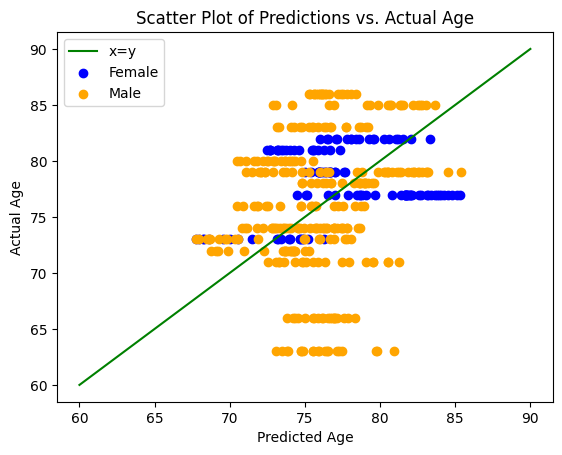

In [127]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(z[test] == g)
    print()
    plt.scatter(predictions[i], y[test][i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

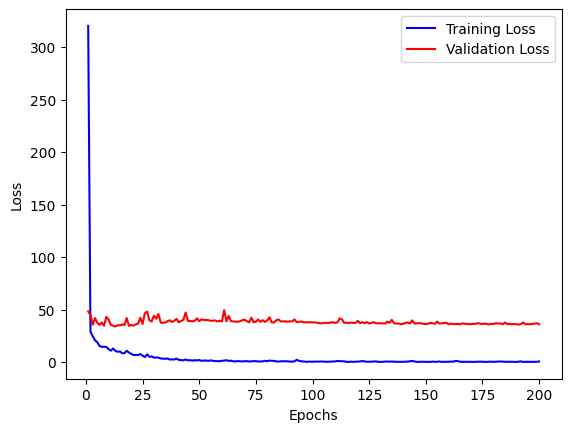

In [128]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

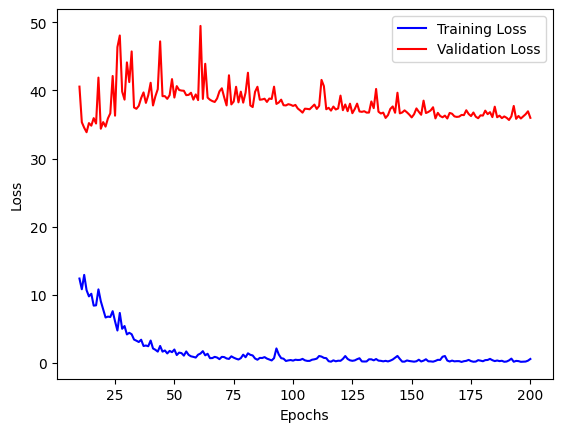

In [129]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### V2

In [130]:
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics

def compile_model():

  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(95, 79, 1))

  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  x = Conv2D(32, kernel_size=(3, 3), activation='relu')(input_img)
  x = MaxPooling2D(pool_size=(2, 2))(x)
  x = Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)


  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(128, activation='relu')(x)
  output_img = Dense(32, activation='linear')(x)

  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))

  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])

  # Add Dense layers for further prediction
  merged = Dense(32, activation='relu')(merged)
  merged = Dense(4, activation='relu')(merged)
  output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks

  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])

  return(model)

In [131]:
def cross_validate(X, y, z, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2




In [132]:
scores_v2, histories_v2, r2_v2 = cross_validate(X, y, z, K = 5)

Epoch 1/200
102/102 [==============================] - 3s 9ms/step - loss: 543.5230 - mean_absolute_error: 14.2078 - val_loss: 42.6500 - val_mean_absolute_error: 4.9227
Epoch 2/200
102/102 [==============================] - 1s 7ms/step - loss: 37.4340 - mean_absolute_error: 4.7879 - val_loss: 18.8358 - val_mean_absolute_error: 3.5484
Epoch 3/200
102/102 [==============================] - 1s 7ms/step - loss: 31.5973 - mean_absolute_error: 4.4626 - val_loss: 17.4392 - val_mean_absolute_error: 3.2654
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 29.6207 - mean_absolute_error: 4.3119 - val_loss: 17.0636 - val_mean_absolute_error: 3.4784
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 28.3204 - mean_absolute_error: 4.2335 - val_loss: 20.1508 - val_mean_absolute_error: 3.3040
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 28.4121 - mean_absolute_error: 4.2397 - val_loss: 24.9296 - val_mean_absolute_error: 3.7

In [134]:
scores_v2

[[28.079561233520508, 4.432161808013916],
 [33.709259033203125, 4.530690670013428],
 [30.072385787963867, 4.64683198928833],
 [31.423490524291992, 4.610693454742432],
 [3079.831298828125, 55.23661804199219]]

In [137]:
np.mean([4.432161808013916,
4.530690670013428,
4.64683198928833,
4.610693454742432])

4.555094480514526

In [138]:
np.mean([28.079561233520508,
33.709259033203125,
30.072385787963867,
31.423490524291992])

30.821174144744873

In [136]:
np.mean([-0.9116567749839588,
 -2.4629745336738234,
 -0.4520105970184283,
 -1.8885788782523218])

-1.4288051959821328

In [140]:
model = compile_model()

# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
for train, test in KFold(n_splits=6, shuffle=True).split(range(102)):
    train = [i for i,a in enumerate(group_id) if a in train+1]
    test = [i for i,a in enumerate(group_id) if a in test+1]
    break
history = model.fit([X[train],z[train]], y[train], validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16).history
predictions = model.predict([X[test], z[test]])

Epoch 1/200
107/107 [==============================] - 3s 8ms/step - loss: 321.2924 - mean_absolute_error: 10.7249 - val_loss: 35.9917 - val_mean_absolute_error: 5.1461
Epoch 2/200
107/107 [==============================] - 1s 6ms/step - loss: 30.8050 - mean_absolute_error: 4.3570 - val_loss: 41.9153 - val_mean_absolute_error: 5.7694
Epoch 3/200
107/107 [==============================] - 1s 6ms/step - loss: 26.2580 - mean_absolute_error: 4.0160 - val_loss: 52.8268 - val_mean_absolute_error: 6.3889
Epoch 4/200
107/107 [==============================] - 1s 6ms/step - loss: 27.6207 - mean_absolute_error: 4.1467 - val_loss: 29.0737 - val_mean_absolute_error: 4.4230
Epoch 5/200
107/107 [==============================] - 1s 6ms/step - loss: 25.5574 - mean_absolute_error: 3.9187 - val_loss: 31.1551 - val_mean_absolute_error: 4.7068
Epoch 6/200
107/107 [==============================] - 1s 6ms/step - loss: 23.6197 - mean_absolute_error: 3.8164 - val_loss: 33.8167 - val_mean_absolute_error: 4.9

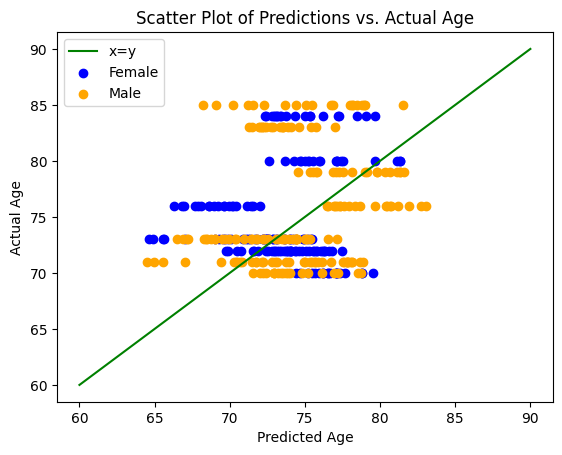

In [141]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(z[test] == g)
    print()
    plt.scatter(predictions[i], y[test][i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

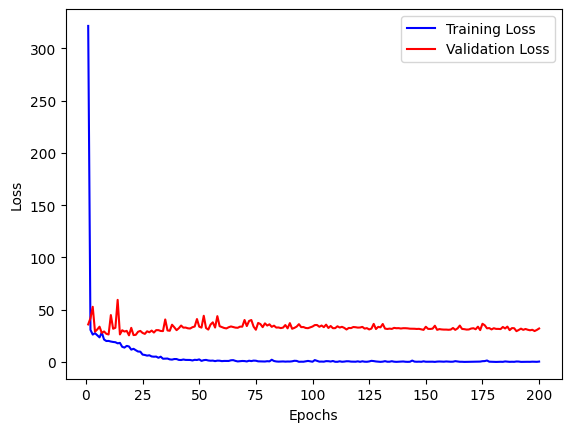

In [142]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

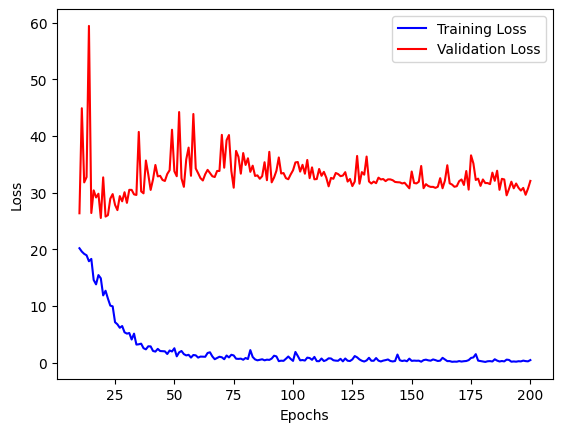

In [143]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### V2.5

In [ ]:
import random
random.seed(42)
def cross_validate(X, y, z, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        z_train = z[train]
        z_test = z[test]
        random.shuffle(z_train)
        random.shuffle(z_test)
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z_train], y[train],
                                   validation_data = ([X[test], z_test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z_test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z_test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_v25, histories_v25, r2_v25 = cross_validate(X, y, z, K = 5)

Epoch 1/200
102/102 [==============================] - 14s 8ms/step - loss: 481.7325 - mean_absolute_error: 12.9400 - val_loss: 38.1442 - val_mean_absolute_error: 4.7313
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 31.2821 - mean_absolute_error: 4.3882 - val_loss: 29.5482 - val_mean_absolute_error: 4.2997
Epoch 3/200
102/102 [==============================] - 1s 5ms/step - loss: 30.5810 - mean_absolute_error: 4.3584 - val_loss: 29.4174 - val_mean_absolute_error: 4.2495
Epoch 4/200
102/102 [==============================] - 1s 5ms/step - loss: 27.5867 - mean_absolute_error: 4.1148 - val_loss: 48.1404 - val_mean_absolute_error: 5.9329
Epoch 5/200
102/102 [==============================] - 1s 5ms/step - loss: 26.4158 - mean_absolute_error: 4.0497 - val_loss: 22.6158 - val_mean_absolute_error: 3.7336
Epoch 6/200
102/102 [==============================] - 1s 5ms/step - loss: 24.8973 - mean_absolute_error: 3.9293 - val_loss: 28.8751 - val_mean_absolute_error: 4.

In [ ]:
scores_v2

[[0.7169077396392822, 0.5302342772483826],
 [3152.109619140625, 55.94488525390625],
 [0.7886942625045776, 0.549382746219635],
 [2.630091905593872, 0.8950560092926025],
 [0.8627952337265015, 0.6469322443008423]]

### V3

In [150]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

In [145]:
new_data = np.repeat(X[:, :, :, np.newaxis], 3, axis=3)

In [152]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input], outputs=output)

  for layer in model.layers[23:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanSquaredError(name='mse'),
               keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [153]:
def cross_validate(X, y, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit(X[train], y[train],
                                   validation_data = (X[test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate(X[test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict(X[test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2

In [154]:
scores_V3, histories_V3, r2_V3 = cross_validate(new_data, y, K = 5)

Epoch 1/200
102/102 [==============================] - 4s 26ms/step - loss: 772.6952 - mse: 772.6952 - mae: 17.4196 - val_loss: 33.8707 - val_mse: 33.8707 - val_mae: 4.9037
Epoch 2/200
102/102 [==============================] - 2s 23ms/step - loss: 36.9877 - mse: 36.9877 - mae: 4.8705 - val_loss: 28.2689 - val_mse: 28.2689 - val_mae: 4.5532
Epoch 3/200
102/102 [==============================] - 2s 23ms/step - loss: 29.6376 - mse: 29.6376 - mae: 4.3288 - val_loss: 24.0742 - val_mse: 24.0742 - val_mae: 4.2287
Epoch 4/200
102/102 [==============================] - 2s 23ms/step - loss: 25.0088 - mse: 25.0088 - mae: 3.9514 - val_loss: 24.0107 - val_mse: 24.0107 - val_mae: 4.1481
Epoch 5/200
102/102 [==============================] - 2s 23ms/step - loss: 23.4058 - mse: 23.4058 - mae: 3.8139 - val_loss: 21.2135 - val_mse: 21.2135 - val_mae: 3.8488
Epoch 6/200
102/102 [==============================] - 2s 23ms/step - loss: 20.5755 - mse: 20.5755 - mae: 3.5839 - val_loss: 20.1831 - val_mse: 20.

In [156]:
print("average test MAE: ", np.asarray(scores_V3)[:,2].mean())

average test MAE:  4.793063163757324


## Getting the best model

In [ ]:
model = Sequential() # using sequential

# Add 3D Convolutional layers with MaxPooling
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))


# Flatten the output and add Dense layers for age prediction
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test, z_train, z_test = train_test_split(X, y, z, test_size=0.2, random_state=42)
model.fit(X_train, y_train, epochs=400, batch_size=16, validation_data = (X_test, y_test))

Epoch 1/400
102/102 [==============================] - 13s 9ms/step - loss: 247.8621 - mean_absolute_error: 10.0326 - val_loss: 33.7370 - val_mean_absolute_error: 4.5954
Epoch 2/400
102/102 [==============================] - 1s 5ms/step - loss: 31.2726 - mean_absolute_error: 4.3872 - val_loss: 31.0015 - val_mean_absolute_error: 4.3434
Epoch 3/400
102/102 [==============================] - 1s 5ms/step - loss: 28.6745 - mean_absolute_error: 4.2530 - val_loss: 26.9340 - val_mean_absolute_error: 4.0794
Epoch 4/400
102/102 [==============================] - 1s 5ms/step - loss: 29.7851 - mean_absolute_error: 4.3504 - val_loss: 26.6544 - val_mean_absolute_error: 4.0875
Epoch 5/400
102/102 [==============================] - 1s 5ms/step - loss: 24.5405 - mean_absolute_error: 3.8903 - val_loss: 32.3695 - val_mean_absolute_error: 4.5452
Epoch 6/400
102/102 [==============================] - 1s 5ms/step - loss: 26.4569 - mean_absolute_error: 4.0463 - val_loss: 51.9999 - val_mean_absolute_error: 6.

13/13 [==============================] - 0s 7ms/step


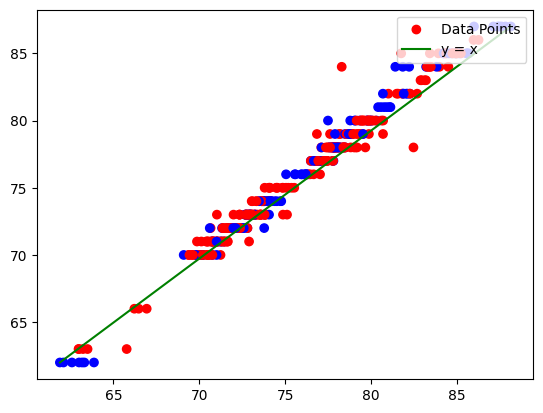

In [ ]:
predictions = model.predict(X_test)

import matplotlib.pyplot as plt

color = {1:'red',-1:'blue'}
# Plot scatter points with colors based on the third list
plt.scatter(predictions, y_test, c = [color[c] for c in z_test], label='Data Points')

# Draw the line x = y
plt.plot([min(predictions), max(predictions)], [min(y_test), max(y_test)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

What if we average round the predictions to the nearest integer

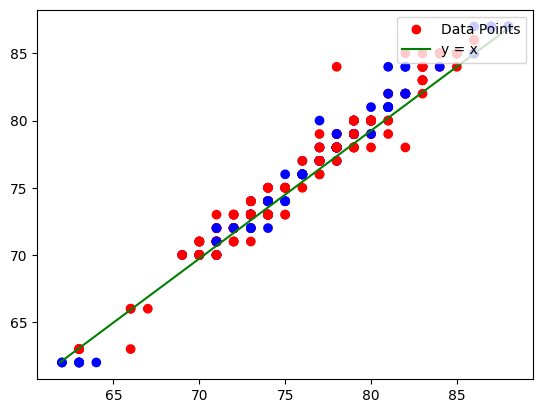

In [ ]:
# Plot scatter points with colors based on the third list
plt.scatter([round(x[0]) for x in predictions], y_test, c = [color[c] for c in z_test], label='Data Points')

# Draw the line x = y
plt.plot([min(predictions), max(predictions)], [min(y_test), max(y_test)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

# MCI conversion Predictor

## Preparing the data

In [ ]:
mci_df = pd.read_csv('/content/drive/MyDrive/MCI DATA/MCI_processed.csv')

In [ ]:
mci_df

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date
0,0,I211819,012_S_1033,MCI,F,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,12/01/2006,NiFTI,NaN,pMCI,6
1,1,I212445,941_S_1311,MCI,M,69,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/30/2007,NiFTI,NaN,pMCI,12
2,2,I211835,018_S_0155,MCI,M,81,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/23/2006,NiFTI,NaN,pMCI,36
3,3,I211851,027_S_0485,MCI,M,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,5/31/2006,NiFTI,NaN,sMCI,18
4,4,I211867,033_S_0906,MCI,F,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,10/23/2006,NiFTI,NaN,pMCI,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232,247,I210152,098_S_2052,EMCI,M,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,9/29/2010,NiFTI,NaN,sMCI,60
233,248,I212404,127_S_1419,MCI,M,78,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,8/31/2007,NiFTI,NaN,sMCI,48
234,249,I211794,003_S_1074,MCI,F,85,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,2/15/2007,NiFTI,NaN,pMCI,108
235,250,I212420,128_S_1407,MCI,F,75,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,6/08/2007,NiFTI,NaN,pMCI,36


In [ ]:
mci_df['Sex'] = mci_df['Sex'].apply(lambda x: 1 if x == 'M' else -1)
mci_df['Label'] = mci_df['Label'].apply(lambda x: 1 if x == 'pMCI' else 0)

Lets see how are data is split depending on where we set the threshhold:

In [ ]:
mci_df[mci_df.Label == -1]['Date']

3       18
8       60
9       48
11     108
16      12
      ... 
230     78
231     24
232     60
233     48
236      6
Name: Date, Length: 126, dtype: int64

In [ ]:
dates = sorted(mci_df.Date.unique())
for threshhold in dates:
  print('Threshhold',threshhold)
  pMCI_counts, sMCI_counts = 0,0
  for row in mci_df.iterrows():
    if row[1]['Label'] == 1:
      if row[1]['Date'] > threshhold:
        sMCI_counts += 1
      else:
        pMCI_counts += 1
    else:
      if row[1]['Date'] < threshhold:
        None
      else:
        sMCI_counts += 1
  print(f'pMCI count: {pMCI_counts}, sMCI count: {sMCI_counts}, we removed {237 - (sMCI_counts + pMCI_counts)} images')




Threshhold 6
pMCI count: 5, sMCI count: 232, we removed 0 images
Threshhold 12
pMCI count: 24, sMCI count: 200, we removed 13 images
Threshhold 18
pMCI count: 40, sMCI count: 173, we removed 24 images
Threshhold 24
pMCI count: 60, sMCI count: 145, we removed 32 images
Threshhold 36
pMCI count: 80, sMCI count: 108, we removed 49 images
Threshhold 48
pMCI count: 91, sMCI count: 75, we removed 71 images
Threshhold 60
pMCI count: 96, sMCI count: 58, we removed 83 images
Threshhold 72
pMCI count: 100, sMCI count: 42, we removed 95 images
Threshhold 78
pMCI count: 100, sMCI count: 38, we removed 99 images
Threshhold 84
pMCI count: 101, sMCI count: 36, we removed 100 images
Threshhold 96
pMCI count: 105, sMCI count: 26, we removed 106 images
Threshhold 108
pMCI count: 107, sMCI count: 20, we removed 110 images
Threshhold 120
pMCI count: 110, sMCI count: 12, we removed 115 images
Threshhold 132
pMCI count: 110, sMCI count: 8, we removed 119 images
Threshhold 138
pMCI count: 111, sMCI count: 6,

36 seems to be the best threshhold as it splits the data the best without removing too much data

In [ ]:
mci_df['Golden Label'] = ''
for i, row in enumerate(mci_df.iterrows()):
    if row[1]['Label'] == 1:
      if row[1]['Date'] > 36:
        mci_df.loc[i, 'Golden Label'] = 'sMCI'

      else:
        mci_df.loc[i, 'Golden Label'] = 'pMCI'
    else:
      if row[1]['Date'] < 36:
        None
      else:
        mci_df.loc[i, 'Golden Label'] = 'sMCI'

In [ ]:
mci_df= mci_df[mci_df['Golden Label'] != '']

In [ ]:
mci_df['Golden Label'] = mci_df['Golden Label'].apply(lambda x: 1 if x == 'pMCI' else 0)

<ipython-input-49-a04e9e13ca1d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mci_df['Golden Label'] = mci_df['Golden Label'].apply(lambda x: 1 if x == 'pMCI' else -1)


In [ ]:
mci_df

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date,Golden Label,Loc
0,0,I211819,012_S_1033,MCI,-1,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,12/01/2006,NiFTI,NaN,1,6,1,/content/drive/MyDrive/MCI DATA/output_imageID...
1,1,I212445,941_S_1311,MCI,1,69,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/30/2007,NiFTI,NaN,1,12,1,/content/drive/MyDrive/MCI DATA/output_imageID...
2,2,I211835,018_S_0155,MCI,1,81,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/23/2006,NiFTI,NaN,1,36,1,/content/drive/MyDrive/MCI DATA/output_imageID...
4,4,I211867,033_S_0906,MCI,-1,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,10/23/2006,NiFTI,NaN,1,18,1,/content/drive/MyDrive/MCI DATA/output_imageID...
5,5,I211883,037_S_1078,MCI,1,71,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,12/22/2006,NiFTI,NaN,1,48,-1,/content/drive/MyDrive/MCI DATA/output_imageID...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,245,I210136,032_S_2119,EMCI,1,72,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,10/25/2010,NiFTI,NaN,-1,78,-1,/content/drive/MyDrive/MCI DATA/output_imageID...
232,247,I210152,098_S_2052,EMCI,1,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,9/29/2010,NiFTI,NaN,-1,60,-1,/content/drive/MyDrive/MCI DATA/output_imageID...
233,248,I212404,127_S_1419,MCI,1,78,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,8/31/2007,NiFTI,NaN,-1,48,-1,/content/drive/MyDrive/MCI DATA/output_imageID...
234,249,I211794,003_S_1074,MCI,-1,85,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,2/15/2007,NiFTI,NaN,1,108,-1,/content/drive/MyDrive/MCI DATA/output_imageID...


In [ ]:
# new colunm for the paths
mci_df['Loc'] = ''
directory = '/content/drive/MyDrive/MCI DATA/output_imageID' # enter the dir were the images are stored

# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    image_id_folder = filename
    if image_id_folder in list(mci_df['Image Data ID']):
      for image in os.listdir(f):
        f = os.path.join(f, image)
        if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
            mci_df.loc[mci_df['Image Data ID']==image_id_folder, 'Loc' ] = f # appending the path



<ipython-input-46-28044c421478>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mci_df['Loc'] = ''


In [ ]:
mci_df[mci_df['Loc'] == '']

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date,Golden Label,Loc


In [ ]:

# Extract image data and corresponding ages from the DataFrame
image_paths = mci_df['Loc'].values
ages = mci_df['Age'].values
sexes = mci_df['Sex'].values
labels = mci_df['Golden Label'].values

# Initialize empty lists to store image arrays and labels
image_data = []

# Loop through each image path, load the image, and append to the lists
for path in image_paths:
    image = nib.load(path).get_fdata()
    image_data.append(image)

# Convert lists to numpy arrays
image_data = np.array(image_data)

In [ ]:
image_data.shape

(188, 79, 95, 68)

In [ ]:
count = 0
locations = []
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

19805


In [ ]:
from collections import Counter
Counter([ele[0] for ele in locations])

Counter({9: 7035, 60: 6490, 119: 817, 135: 3069, 185: 2394})

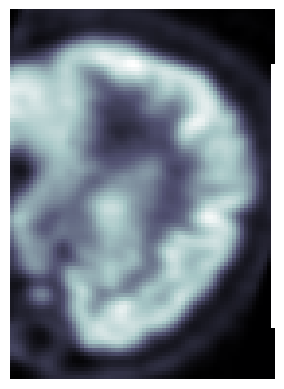

In [ ]:
plt.imshow(image_data[9][20], cmap='bone')
plt.axis('off')
plt.show()

In [ ]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  image_data[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)

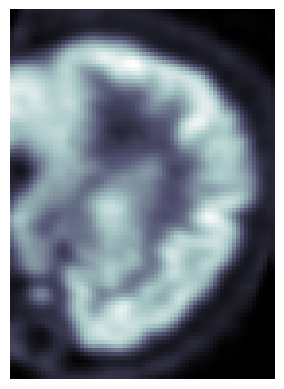

In [ ]:
plt.imshow(image_data[9][20], cmap='bone')
plt.axis('off')
plt.show()

In [ ]:
"""count = 0
locations = []
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)"""

'count = 0\nlocations = []\nshape = image_data.shape\nfor a in range(shape[0]):\n  for b in range(shape[1]):\n    for c in range(shape[2]):\n      for d in range(shape[3]):\n        if pd.isna(image_data[a][b][c][d]):\n          locations.append([a,b,c,d])\n          count+=1\nprint(count)'

In [ ]:
from skimage.feature import greycomatrix
from skimage import img_as_ubyte
mci_twod_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'label'])
slice_counter = 0
rotation_angle = 90
counter = 0
for image_array, age, sex, label in zip(image_data, ages, sexes, labels):
  print(image_array.shape)
  counter += 1
  total_volumes = 1
  total_slices = image_array.shape[2]
  for current_volume in range(0, total_volumes):
      # iterate through slices
      for current_slice in range(0, total_slices):
          if (slice_counter % 1) == 0:
              if rotation_angle == 90:
                  data = np.rot90(image_array[:, :, current_slice])
              elif rotation_angle == 180:
                  data = np.rot90(np.rot90(image_array[:, :, current_slice]))
              elif rotation_angle == 270:
                  data = np.rot90(np.rot90(np.rot90(image_array[:, :, current_slice])))
              #alternate slices and save as png
              if (slice_counter % 1) == 0:
                  print('Adding image...')
                  min_val = np.min(data)
                  max_val = np.max(data)
                  im = 2 * (data - min_val) / (max_val - min_val) - 1
                  im = img_as_ubyte(im)
                  glcm = np.squeeze(greycomatrix(im, distances=[1], angles=[0], symmetric=True, normed=True))
                  entropy = -np.sum(glcm*np.log2(glcm + (glcm==0)))
                  new_row = {'id':counter, 'age':age, 'sex':sex, 'entropy':entropy, 'data':data, 'label':label}
                  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
                  #imsave(imge_folder +str(counter)+'_'+x_label2+'.jpg', data,format='jpg')
                  print('Saved.')

(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The f

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-60-3fea83d0c681>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/

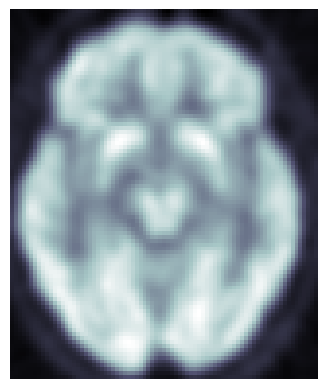

In [ ]:
plt.imshow(mci_twod_df['data'][mci_twod_df['entropy'].idxmax()], cmap='bone')
plt.axis('off')
plt.show()

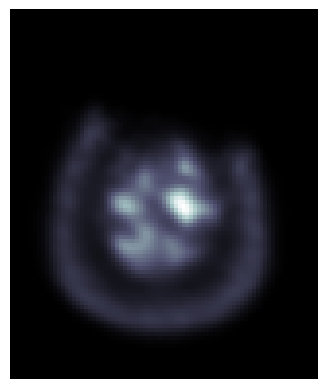

In [ ]:
plt.imshow(mci_twod_df['data'][mci_twod_df['entropy'].idxmin()], cmap='bone')
plt.axis('off')
plt.show()

## Some visualisations of the data

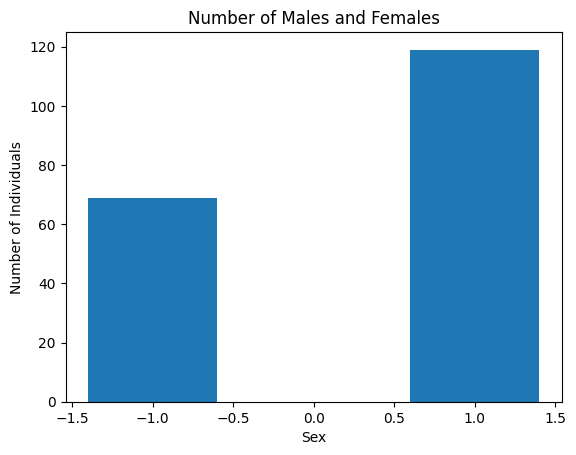

In [ ]:
sex_counts = mci_df["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

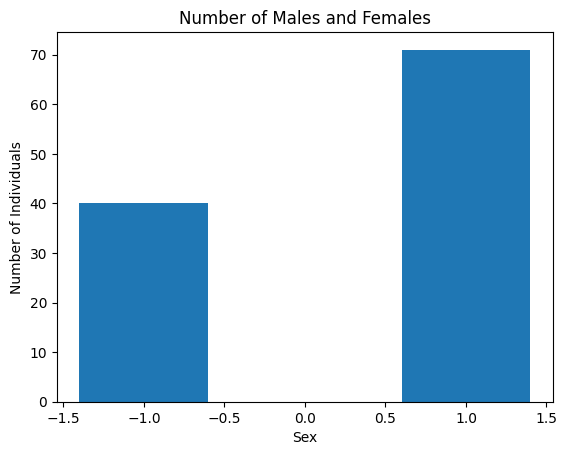

In [ ]:
sex_counts = mci_df[mci_df['Label']==1]["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

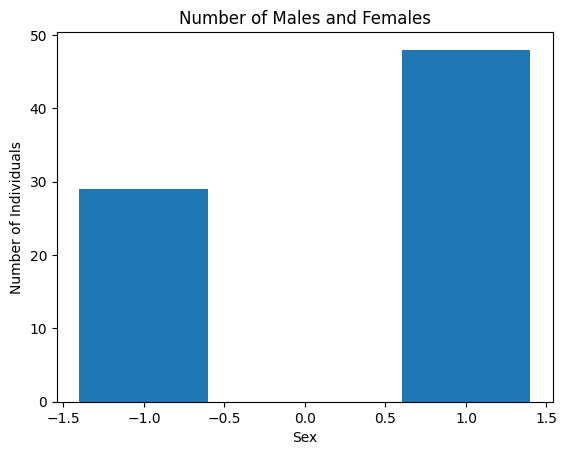

In [ ]:
sex_counts = mci_df[mci_df['Label']==-1]["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

Text(0.5, 1.0, 'Age Distribution')

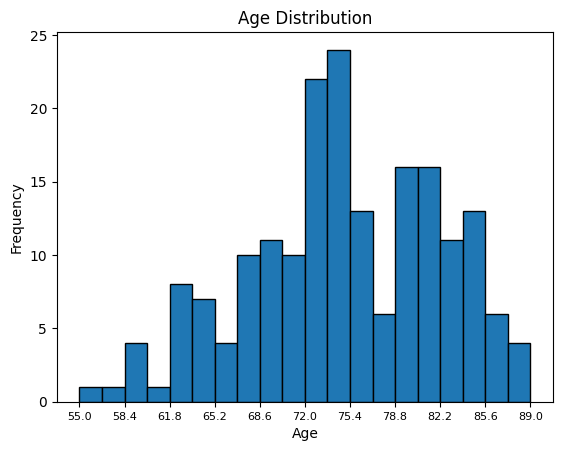

In [ ]:
plt.hist(mci_df["Age"], bins=20, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

Text(0.5, 1.0, 'Age Distribution')

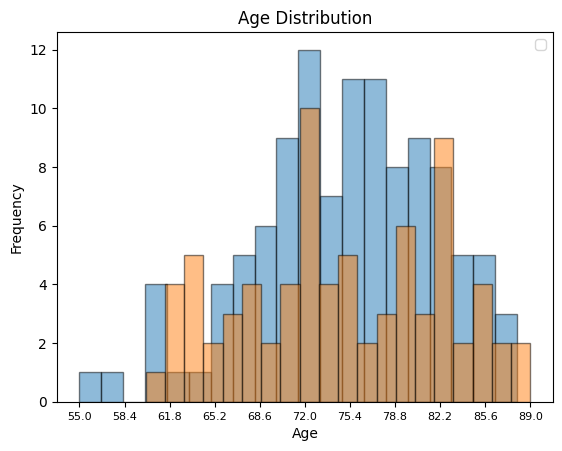

In [ ]:
plt.hist(mci_df[mci_df['Label']==1]["Age"], bins=20, alpha=0.5, edgecolor="black")
plt.hist(mci_df[mci_df['Label']==-1]["Age"], bins=20, alpha=0.5, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.legend(loc='upper right')

num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

Text(0.5, 1.0, 'Age Distribution')

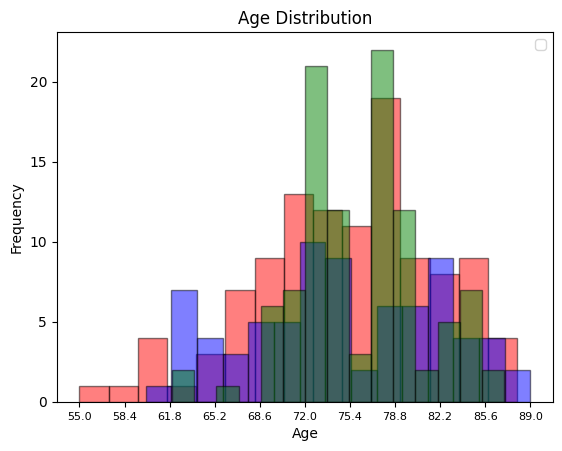

In [ ]:
plt.hist(mci_df[mci_df['Label']==1]["Age"], bins=15, alpha=0.5, edgecolor="black", color='red')
plt.hist(mci_df[mci_df['Label']==-1]["Age"], bins=15, alpha=0.5, edgecolor="black", color = 'blue')
plt.hist(df["Age"], bins=15, alpha=0.5, edgecolor="black", color='green')
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.legend(loc='upper right')

num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

In [ ]:
mci_twod_df

,id,age,sex,entropy,data,label
0,1,73,-1,2.962042,"[[0.0012566640507429838, 0.0006672602030448616...",1
1,1,73,-1,3.266010,"[[0.005831534508615732, 0.004074377007782459, ...",1
2,1,73,-1,3.586705,"[[0.0025276336818933487, 0.0037867948412895203...",1
3,1,73,-1,3.913472,"[[-0.0035421315114945173, 0.001200263504870236...",1
4,1,73,-1,4.186998,"[[-0.00891648419201374, -0.005033640656620264,...",1
...,...,...,...,...,...,...
12779,188,75,-1,1.968181,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.969149707292...",1
12780,188,75,-1,1.548230,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.2756951...",1
12781,188,75,-1,1.314213,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1
12782,188,75,-1,1.111402,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1


In [ ]:
mci_high_entropy_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'label'])
for id in mci_twod_df.id.unique():
  filtered_df = mci_twod_df[mci_twod_df.id == id].sort_values(by=['entropy'], ascending=False).head(20)
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)


<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append metho

In [ ]:
mci_high_entropy_df

,id,age,sex,entropy,data,label
16,1,73,-1,8.503109,"[[-0.010737914592027664, -0.01956712268292904,...",1
18,1,73,-1,8.467059,"[[-0.009189191274344921, -0.010210409760475159...",1
15,1,73,-1,8.433147,"[[-0.008829991333186626, -0.018925653770565987...",1
17,1,73,-1,8.414684,"[[-0.011152115650475025, -0.016327910125255585...",1
14,1,73,-1,8.198814,"[[-0.0070784869603812695, -0.01700356416404247...",1
...,...,...,...,...,...,...
12731,188,75,-1,7.856287,"[[0.0, 0.0, 0.0, 0.0, 2.0399130562509526e-07, ...",1
12747,188,75,-1,7.417500,"[[0.0, 0.0, 0.0, 0.0, 1.7709224948703195e-06, ...",1
12730,188,75,-1,7.395668,"[[0.0, 0.0, 0.0, 0.0, 0.0, 1.7699372619972564e...",1
12748,188,75,-1,6.981628,"[[2.254813352919882e-06, 1.7587442471267423e-0...",1


In [ ]:
mci_X = np.array(mci_high_entropy_df['data'])
mci_y = np.array(mci_high_entropy_df['label'])

In [ ]:
mci_X = np.array([mci_X[i] for i in range(len(mci_X))])
mci_y = np.array([mci_y[i] for i in range(len(mci_y))])

In [ ]:
mci_age = np.array(mci_high_entropy_df['age'])
mci_sex = np.array(mci_high_entropy_df['sex'])

## Adding the Age gap biomarker

In [ ]:
mci_age_predictions = model.predict(mci_X)

118/118 [==============================] - 0s 3ms/step


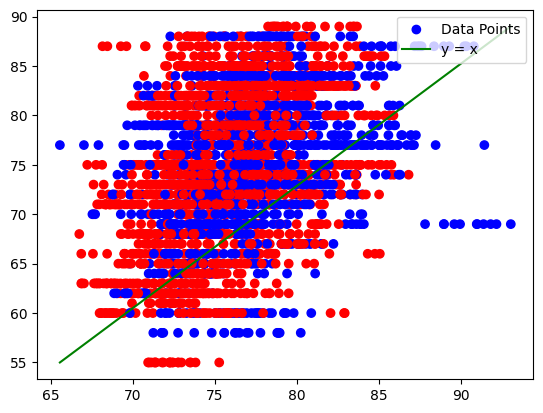

In [ ]:
import matplotlib.pyplot as plt

# Create a color map: -1 is red and 1 is blue
colormap = {0: 'red', 1: 'blue'}

# Plot scatter points with colors based on the third list
plt.scatter(mci_age_predictions, mci_age, c=[colormap[c] for c in mci_y], label='Data Points')

# Draw the line x = y
plt.plot([min(mci_age_predictions), max(mci_age_predictions)], [min(mci_age), max(mci_age)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()


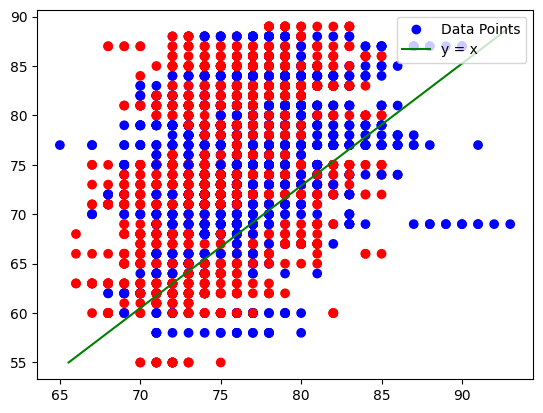

In [ ]:
import matplotlib.pyplot as plt


# Plot scatter points with colors based on the third list
plt.scatter([int(x[0]) for x in mci_age_predictions], mci_age, c=[colormap[c] for c in mci_y], label='Data Points')

# Draw the line x = y
plt.plot([min(mci_age_predictions), max(mci_age_predictions)], [min(mci_age), max(mci_age)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

In [ ]:
age_gap = [prediction - actual for prediction, actual in zip(mci_age_predictions, mci_age)]

In [ ]:
smci_age_gaps = [age for age,label,sex in zip(age_gap, mci_y, mci_sex) if label ==-1]
pmci_age_gaps = [age for age,label,sex in zip(age_gap, mci_y, mci_sex) if label ==1]

In [ ]:
len(smci_age_gaps) + len(pmci_age_gaps)

3760

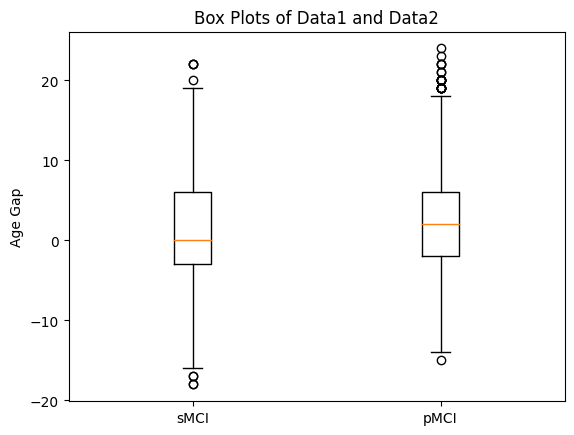

In [ ]:
import matplotlib.pyplot as plt

# Create a combined dataset
box_plot_data = [[int(a[0]) for a in smci_age_gaps], [int(a[0]) for a in pmci_age_gaps]]

# Create labels for the box plots
labels = ['sMCI', 'pMCI']

# Create the box plots
plt.boxplot(box_plot_data, labels=labels)

# Set the title and y-axis label
plt.title("Box Plots of sMCI vs pMCI Age Gap")
plt.ylabel("Age Gap")

# Display the plot
plt.show()


In [ ]:
print(np.mean([a[0] for a in smci_age_gaps]),np.mean([a[0] for a in pmci_age_gaps]))

1.1330577 2.042619


## Building a model

In [ ]:
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics

def compile_model():

  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(95, 79, 1))

  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  x = Conv2D(32, kernel_size=(3, 3), activation='relu')(input_img)
  x = MaxPooling2D(pool_size=(2, 2))(x)
  x = Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)


  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(128, activation='relu')(x)
  output_img = Dense(32, activation='relu')(x)

  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))

  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])

  # Add Dense layers for further prediction
  merged = Dense(32, activation='relu')(merged)
  merged = Dense(4, activation='relu')(merged)
  output = Dense(1, activation='sigmoid')(merged)  # Use 'linear' activation for regression tasks

  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)

  # Compile the model
  model.compile(loss=keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy'])

  return(model)

In [ ]:
def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16, shuffle = True # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
    """print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())"""
    print(model.summary())
    return scores, histories

In [ ]:
mci_y = np.array([(i+1)/2 for i in mci_y])

In [ ]:
scores_mci, histories_mci = cross_validate(mci_X, mci_y, age_gap, K = 5)

Epoch 1/200
188/188 [==============================] - 4s 8ms/step - loss: 0.6871 - accuracy: 0.5662 - val_loss: 0.6800 - val_accuracy: 0.5931
Epoch 2/200
188/188 [==============================] - 1s 7ms/step - loss: 0.6638 - accuracy: 0.5961 - val_loss: 0.6440 - val_accuracy: 0.6622
Epoch 3/200
188/188 [==============================] - 1s 7ms/step - loss: 0.6179 - accuracy: 0.6549 - val_loss: 0.6101 - val_accuracy: 0.6769
Epoch 4/200
188/188 [==============================] - 1s 7ms/step - loss: 0.5917 - accuracy: 0.6699 - val_loss: 0.5881 - val_accuracy: 0.6795
Epoch 5/200
188/188 [==============================] - 1s 7ms/step - loss: 0.5745 - accuracy: 0.6825 - val_loss: 0.5624 - val_accuracy: 0.7074
Epoch 6/200
188/188 [==============================] - 1s 7ms/step - loss: 0.5185 - accuracy: 0.7221 - val_loss: 0.5051 - val_accuracy: 0.7380
Epoch 7/200
188/188 [==============================] - 1s 7ms/step - loss: 0.4677 - accuracy: 0.7660 - val_loss: 0.4510 - val_accuracy: 0.7739

In [ ]:
import random
random.seed(42)
def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        z_train = z[train]
        z_test = z[test]
        random.shuffle(z_train)
        random.shuffle(z_test)
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z_train], y[train],
                                   validation_data = ([X[test], z_test],y[test]), epochs=200, batch_size=32, shuffle = True # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z_test], y[test], verbose = 0)) # evaluate the test dataset
    """print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())"""
    print(model.summary())
    return scores, histories



In [ ]:
scores_mci_noag, histories_mci_noag = cross_validate(mci_X, mci_y, age_gap, K = 5)

Epoch 1/200
94/94 [==============================] - 4s 11ms/step - loss: 0.6890 - accuracy: 0.5625 - val_loss: 0.6903 - val_accuracy: 0.5532
Epoch 2/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6852 - accuracy: 0.5775 - val_loss: 0.6924 - val_accuracy: 0.5505
Epoch 3/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6611 - accuracy: 0.6220 - val_loss: 0.6385 - val_accuracy: 0.6569
Epoch 4/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6319 - accuracy: 0.6546 - val_loss: 0.6274 - val_accuracy: 0.6543
Epoch 5/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6187 - accuracy: 0.6606 - val_loss: 0.6160 - val_accuracy: 0.6569
Epoch 6/200
94/94 [==============================] - 1s 8ms/step - loss: 0.5821 - accuracy: 0.6805 - val_loss: 0.5889 - val_accuracy: 0.6848
Epoch 7/200
94/94 [==============================] - 1s 8ms/step - loss: 0.5116 - accuracy: 0.7354 - val_loss: 0.5399 - val_accuracy: 0.7460
Epoch 8/200
